# Entrenamiento del modelo YOLO

### **Objetivo**

El objetivo de este notebook es detallar el proceso completo seguido para el entrenamiento de un modelo YOLO capaz de detectar los tipos de ingredientes dentro de la nevera. Los sets de datos utilizados son los resultantes de "1) Construcción dataset detección de objetos en la nevera". 

Cabe destacar que YOLO suele utilizar pesos iniciales preentrenados en el dataset COCO (Common Objects in Context), que contiene más de 330.000 imágenes y alrededor de 1,5 millones de instancias de objetos de utilidad general.
En este trabajo, se emplearán dichos pesos como punto de partida mediante transfer learning, realizando posteriormente un fine-tuning del modelo para adaptarlo específicamente a la detección de ingredientes en la nevera.

## 1) Entrenamiento del modelo

**Resumen de los resultados**

En este notebook se han hecho las siguientes iteraciones/entrenamientos a la hora de entrenar el modelo YOLO con fotos específicas de ingredientes en la nevera:

- *`Modelo 1 - 5 epochs sin datos sintéticos`*: Se ha entrenado un modelo base sencillo de tan solo 5 epochs solamente con los datasets públicos (sin el sintético generado) para ver cuál sería el rendimiento base.
- *`Modelo 2 - 10 epochs con datos sintéticos`*: Se ha entrenado un modelo de 10 epochs donde se ha incluido un dataset generado de manera sintética para cubrir ingredientes con baja o nula representación. 
- *`Modelo 3 - 100 epochs con datos sintéticos`*: Se ha entrenado un modelo de 100 epochs incluyendo el dataset sintético y con tamaño de imagen 768.

Los resultados principales han sido los siguientes:

| Métrica       | Modelo 1 (5 épocas) | Modelo 2 (10 épocas) | Modelo 3 (100 épocas) | Aceptable | Bueno   | SOTA (State of the Art) |
|---------------|----------------------|-----------------------|------------------------|-----------|---------|--------------------------|
| **Precisión** | ~0.76               | ~0.91                | ~0.96                 | >0.6      | >0.8    | >0.9                     |
| **Recall**    | ~0.60               | ~0.81                | ~0.91                 | >0.5      | >0.7    | >0.85                    |
| **mAP50**     | ~0.67               | ~0.89                | ~0.96                 | 0.5–0.6   | 0.7–0.8 | >0.85                    |
| **mAP50-95**  | ~0.45               | ~0.65                | ~0.82                 | 0.3–0.4   | 0.5–0.6 | >0.65                    |

**Notas:**
- Los valores de referencia se basan en resultados reportados en benchmarks como COCO.
- "Aceptable" indica un modelo funcional pero básico; "Bueno" corresponde a modelos competitivos en aplicaciones reales; "SOTA" refleja los mejores resultados publicados en la literatura.
- El **Modelo 1 (5 épocas)** valida que el modelo tiene potencial. 
- El **Modelo 2 (10 épocas)** logra métricas ya en rango de "buenos modelos", valida que la inclusión de dataset sintético no distorsiona o empeora el modelo.  
- El **Modelo 3 (100 épocas)** se acerca a valores comparables con **benchmarks SOTA** (incluso superandolo en algunos casos), mostrando un rendimiento sólido y generalizable. Sin embargo, cabe mencionar que COCO es un modelo que identifica 80 clases mientras que nuestro modelo solo lidia con 30.



### 1.1) Imports

In [1]:
import os
import torch
from ultralytics import YOLO
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Image as Image_
sns.set_theme()

print(torch.cuda.is_available())  # Should return: True
print(torch.cuda.get_device_name(0))  # Should show your GPU name


True
NVIDIA RTX 2000 Ada Generation Laptop GPU


### 1.2) Primer entrenamiento - modelo 5 epochs sin datos sintéticos

En esta sección, entrenamos un primer modelo básico muy sencillo de 5 épocas para ver que rendimiento tiene el modelo si no introdujesemos fotos sintéticas para ayudar con las clases sin mucha representación dentro del modelo.

In [8]:
model_5epochs = YOLO('yolo11n.pt')
model_5epochs.train(data=r'..\dataset\YOLO - Clean dataset\Clean dataset 1\train_test_val_dataset - 1st iteration\data.yaml', epochs=5, imgsz=640)

New https://pypi.org/project/ultralytics/8.3.178 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.176  Python-3.10.18 torch-2.5.1 CUDA:0 (NVIDIA RTX 2000 Ada Generation Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=..\dataset\YOLO - Clean dataset\Clean dataset 1\train_test_val_dataset - 1st iteration\data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.9

train: Scanning C:\Users\oscar.xu\OneDrive - King Digital\King\Oscar - Personal\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 1\train_test_val_dataset - 1st iteration\train\labels... 9873 images, 0 backgrounds, 0 corrupt: 100%|██████████| 9873/9873 [00:09<00:00, 1049.75it/s]


train: New cache created: C:\Users\oscar.xu\OneDrive - King Digital\King\Oscar - Personal\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 1\train_test_val_dataset - 1st iteration\train\labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access  (ping: 0.60.1 ms, read: 164.090.4 MB/s, size: 98.1 KB)


val: Scanning C:\Users\oscar.xu\OneDrive - King Digital\King\Oscar - Personal\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 1\train_test_val_dataset - 1st iteration\val\labels... 2115 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2115/2115 [00:00<00:00, 2622.48it/s]


val: New cache created: C:\Users\oscar.xu\OneDrive - King Digital\King\Oscar - Personal\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 1\train_test_val_dataset - 1st iteration\val\labels.cache
Plotting labels to runs\detect\train3\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000294, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train3
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      2.88G      1.519      3.775      1.285          9        640: 100%|██████████| 618/618 [01:25<00:00,  7.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 67/67 [00:09<00:00,  7.35it/s]


                   all       2115      12549      0.662      0.376      0.409      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      2.89G      1.379      2.107      1.222          4        640: 100%|██████████| 618/618 [01:21<00:00,  7.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 67/67 [00:10<00:00,  6.54it/s]


                   all       2115      12549      0.657      0.484      0.521      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      2.89G      1.302      1.729      1.187         15        640: 100%|██████████| 618/618 [01:23<00:00,  7.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 67/67 [00:10<00:00,  6.44it/s]


                   all       2115      12549      0.732      0.522      0.579      0.365

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      2.89G      1.248      1.538      1.165          2        640: 100%|██████████| 618/618 [01:25<00:00,  7.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 67/67 [00:10<00:00,  6.35it/s]


                   all       2115      12549      0.741      0.575      0.624      0.421

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      2.89G      1.209      1.442      1.144          2        640: 100%|██████████| 618/618 [01:24<00:00,  7.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 67/67 [00:10<00:00,  6.31it/s]


                   all       2115      12549      0.756      0.606      0.669      0.453

5 epochs completed in 0.132 hours.
Optimizer stripped from runs\detect\train3\weights\last.pt, 5.5MB
Optimizer stripped from runs\detect\train3\weights\best.pt, 5.5MB

Validating runs\detect\train3\weights\best.pt...
Ultralytics 8.3.176  Python-3.10.18 torch-2.5.1 CUDA:0 (NVIDIA RTX 2000 Ada Generation Laptop GPU, 8188MiB)
YOLO11n summary (fused): 100 layers, 2,588,002 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 67/67 [00:11<00:00,  6.01it/s]


                   all       2115      12549      0.755      0.607      0.669      0.453
                Tomate        942       1203      0.829      0.751      0.833       0.57
               Cebolla        473        484      0.932      0.853      0.924      0.668
                Patata        627        629      0.792      0.887      0.912      0.641
       Lechuga/Endivia        164        196      0.587      0.531      0.571      0.379
             Zanahoria        724        834      0.883       0.79      0.861      0.587
                Pepino        112        170      0.656      0.168      0.253      0.138
           Championes        460        462      0.854      0.931      0.963      0.644
               Brocoli         43         76      0.584      0.628      0.586      0.374
              Coliflor          5         26          1          0      0.517      0.266
                 Leche        676        904      0.847      0.819      0.885      0.671
                Huevos

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 20, 21, 23, 24, 25, 26, 27, 28, 29])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002AEEE44A620>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,  

In [3]:
model_1 = YOLO(r"..\models\YOLO\runs\detect\train 1 - 5 epochs without synthethic\weights\best.pt")
metrics = model_1.val(data=r"..\dataset\YOLO - Clean dataset\Clean dataset 1\train_test_val_dataset - 1st iteration\data.yaml", split="test")

Ultralytics 8.3.179  Python-3.10.18 torch-2.7.1+cu118 CUDA:0 (NVIDIA RTX 2000 Ada Generation Laptop GPU, 8188MiB)
YOLO11n summary (fused): 100 layers, 2,588,002 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 136.590.5 MB/s, size: 76.2 KB)


val: Scanning C:\Users\oscar.xu\Desktop\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 1\train_test_val_dataset - 1st iteration\test\labels... 2117 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2117/2117 [00:00<00:00, 2144.19it/s]


val: New cache created: C:\Users\oscar.xu\Desktop\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 1\train_test_val_dataset - 1st iteration\test\labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 133/133 [00:13<00:00, 10.13it/s]


                   all       2117      12841      0.766      0.591      0.667      0.445
                Tomate        979       1249      0.833      0.754      0.832      0.574
               Cebolla        516        564       0.95      0.778      0.875      0.639
                Patata        635        644      0.846      0.882      0.923       0.63
       Lechuga/Endivia        187        219      0.679      0.543      0.621      0.396
             Zanahoria        726        867      0.877      0.757      0.844      0.574
                Pepino        113        159      0.602      0.228      0.296      0.155
           Championes        511        512      0.875      0.926      0.948      0.638
               Brocoli         51        116      0.502        0.5        0.5      0.233
              Coliflor          4         32          1          0      0.464      0.248
                 Leche        705        911      0.866      0.802      0.868      0.646
                Huevos

In [4]:
metrics

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 20, 21, 23, 24, 25, 26, 27, 28, 29])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000016ED94C14B0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,  

### 1.3) Primer modelo - evaluación del modelo

A continuación, mostramos los resultados del modelo entrenado:

In [3]:
model_5epochs_results = pd.read_csv(r'..\models\YOLO\runs\detect\train 1 - 5 epochs without synthethic\results.csv')
model_5epochs_results

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,95.1385,1.51888,3.77543,1.28508,0.66231,0.37576,0.40890,0.25775,1.33950,2.14927,1.23982,0.000098,0.000098,0.000098
1,2,187.3590,1.37864,2.10747,1.22207,0.65737,0.48399,0.52093,0.32731,1.29227,1.64185,1.21425,0.000157,0.000157,0.000157
2,3,281.3780,1.30168,1.72877,1.18663,0.73190,0.52171,0.57946,0.36530,1.27324,1.48368,1.19627,0.000177,0.000177,0.000177
3,4,378.1210,1.24801,1.53811,1.16465,0.74091,0.57518,0.62418,0.42141,1.17735,1.34184,1.15393,0.000119,0.000119,0.000119
4,5,473.7810,1.20865,1.44173,1.14353,0.75576,0.60629,0.66900,0.45282,1.14908,1.23878,1.13405,0.000061,0.000061,0.000061


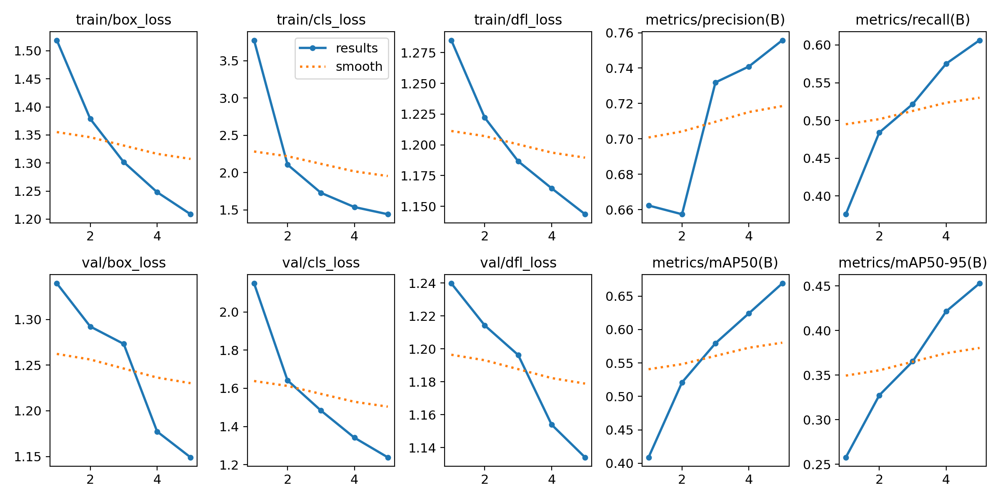

In [ ]:
# Mostramos la imagen de los resultados obtenidos con el entrenamiento
Image_(filename=r'..\models\YOLO\runs\detect\train 1 - 5 epochs without synthethic\results.png', width=600, height=400)

Podemos ver en las gráficas que:
- Las métricas de pérdida de entrenamiento y validación (box, cls, dfl) disminuyen a medida que aumenta la cantidad de epochs, esto indica que el modelo sigue aprendiendo y mejorando con más épocas de entrenamiento. Por lo tanto, añadir la cantidad de épocas probablemente mejoraría el modelo. Adicionalmente mencionar que val loss es parecido a train loss por lo que indica que el modelo generaliza bien.
- Precisión ≈ 0.77 → De cada 100 predicciones positivas que hace el modelo, 75 son correctas. Esto significa que el modelo comete pocos falsos positivos, prediciendo con bastante certeza cuando identifica un ingrediente.
- Recall ≈ 0.59 → Por otro lado, el modelo detecta alrededor del 60 % de los objetos presentes en las imágenes. Esto significa que a pesr de tener buena precisión, deja escapar bastantes objetos sin predecir.
- mAP50 ≈ 0.67 → mAP combina la métrica de precisión y recall para un umbral de IoU (intersection over union) de 0.5 para todas las clases predichas. IoU mide qué tan bien coincide la caja delimitada predicha por el modelo con la caja delimitada real. Por lo que un 0.65 de map50 significa que el modelo con un umbral de 0.5, el modelo detecta bien qué ingredientes hay en la nevera y sus ubicaciones aproximadas.
- mAP50-95 ≈ 0.45 → Calcula el mAP en 10 umbrales distintos de IoU (0.5, 0.55, 0.60, …, 0.95) y hace el promedio. Es mucho más estricto, porque exige que las cajas estén muy bien alineadas con el objeto. El modelo aún falla en ubicar con exactitud los bordes de los ingredientes (ej. la caja predicha no se ajusta del todo al tomate o al envase).

A continuación, analizamos la matriz de confusión:
- Podemos ver que el modelo predice ciertas clases muy bien, como el tomate
- Pero también hay clases más flojas en cuanto a precisión como Brocoli o Limón (color muy clarito)

A pesar de que el modelo tiene un rendimiento aceptable, hay clases que apenas tienen fotos para el entrenamiento como Brocoli o Salchichas y hay clases que no tienen fotos en absoluto (por ejemplo salmón, sandía, lubina, etc.). Por lo tanto, para que el modelo puede predecir dichas clases, se tiene que incluir sí o sí un dataset sintético con datos sobre estas clases.

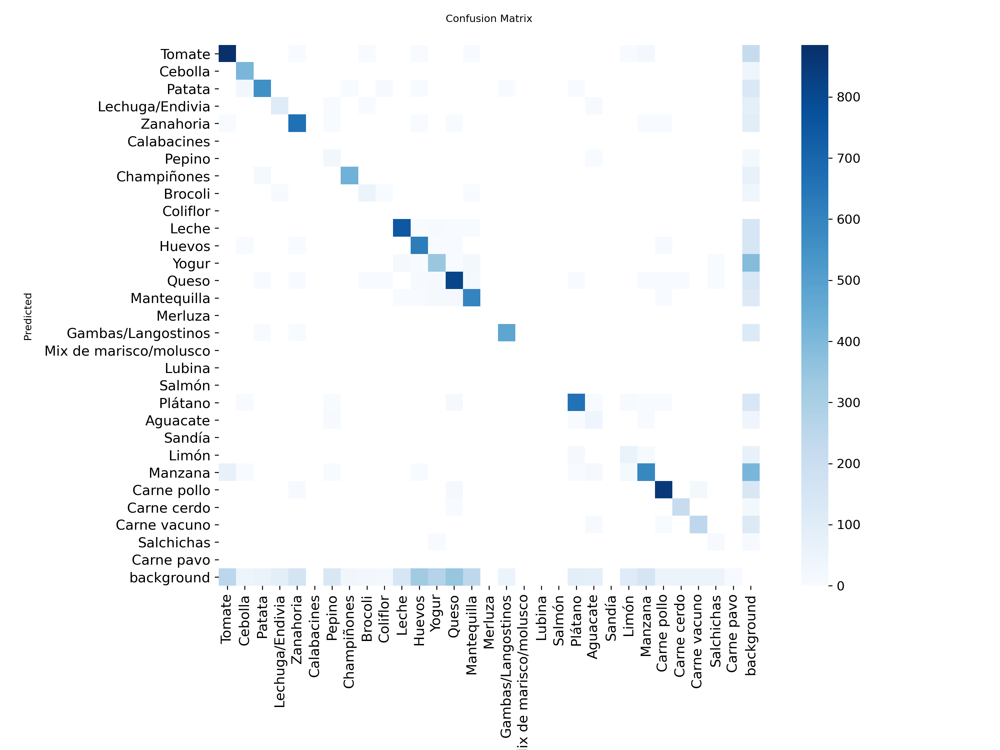

In [11]:
Image_(filename=r'..\models\YOLO\runs\detect\train 1 - 5 epochs without synthethic\confusion_matrix.png', width=800, height=600)

### 1.4) Segundo entrenamiento - modelo 10 epochs con datos sintéticos

Después de entrenar el primer modelo, realizamos un segundo entrenamiento, esta vez con más epochs e incluyendo el dataset sintético que se ha construido en "1.Construcción dataset detección objetos".
Se ha decidido aumentar la cantidad de épocas porque hemos visto que claramente el modelo aún no había alcanzado un punto plano en términos de métrica de pérdida, por lo que el modelo sigue aprendiendo.

In [ ]:
model_10epochs_refined_dataset = YOLO('yolo11n.pt')
model_10epochs_refined_dataset.train(data=r'..\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\data.yaml', epochs=10, imgsz=640)

New https://pypi.org/project/ultralytics/8.3.178 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.176  Python-3.10.18 torch-2.5.1 CUDA:0 (NVIDIA RTX 2000 Ada Generation Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=..\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_sc

train: Scanning C:\Users\oscar.xu\OneDrive - King Digital\King\Oscar - Personal\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\train\labels.cache... 11956 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11956/11956 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access  (ping: 0.30.2 ms, read: 113.386.8 MB/s, size: 169.5 KB)


val: Scanning C:\Users\oscar.xu\OneDrive - King Digital\King\Oscar - Personal\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\val\labels... 2562 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2562/2562 [00:03<00:00, 649.19it/s]


val: New cache created: C:\Users\oscar.xu\OneDrive - King Digital\King\Oscar - Personal\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\val\labels.cache
Plotting labels to runs\detect\train3\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000294, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train3
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.74G      1.516      3.726      1.294         28        640: 100%|██████████| 748/748 [02:51<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:17<00:00,  4.74it/s]


                   all       2562      15683      0.494      0.418      0.417      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.74G      1.377      2.121      1.217         20        640: 100%|██████████| 748/748 [02:12<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:16<00:00,  4.77it/s]


                   all       2562      15683       0.67      0.567      0.625      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.74G      1.294      1.691      1.183         11        640: 100%|██████████| 748/748 [02:12<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:16<00:00,  4.81it/s]


                   all       2562      15683      0.693      0.649      0.706      0.445

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.74G      1.238      1.472      1.157         26        640: 100%|██████████| 748/748 [02:09<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:16<00:00,  4.98it/s]


                   all       2562      15683      0.797       0.69      0.773       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.74G      1.193      1.318      1.134         17        640: 100%|██████████| 748/748 [02:11<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:16<00:00,  5.00it/s]


                   all       2562      15683      0.837      0.729      0.819      0.557

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.74G       1.14      1.188       1.11         17        640: 100%|██████████| 748/748 [02:10<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:16<00:00,  5.01it/s]


                   all       2562      15683      0.855      0.743      0.836      0.583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.74G      1.106      1.107      1.091         18        640: 100%|██████████| 748/748 [02:11<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:16<00:00,  5.03it/s]


                   all       2562      15683      0.874      0.772      0.857      0.613

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.74G       1.07      1.036      1.076         25        640: 100%|██████████| 748/748 [02:10<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:17<00:00,  4.76it/s]


                   all       2562      15683      0.887       0.79      0.873      0.629

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.74G      1.039     0.9817      1.062         19        640: 100%|██████████| 748/748 [02:13<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:17<00:00,  4.59it/s]


                   all       2562      15683      0.892      0.808      0.884       0.65

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.74G      1.016     0.9436       1.05         23        640: 100%|██████████| 748/748 [02:13<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:17<00:00,  4.62it/s]


                   all       2562      15683      0.907      0.809      0.889      0.652

10 epochs completed in 0.433 hours.
Optimizer stripped from runs\detect\train3\weights\last.pt, 5.5MB
Optimizer stripped from runs\detect\train3\weights\best.pt, 5.5MB

Validating runs\detect\train3\weights\best.pt...
Ultralytics 8.3.176  Python-3.10.18 torch-2.5.1 CUDA:0 (NVIDIA RTX 2000 Ada Generation Laptop GPU, 8188MiB)
YOLO11n summary (fused): 100 layers, 2,588,002 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:20<00:00,  3.97it/s]


                   all       2562      15683      0.906       0.81      0.889      0.651
                Tomate        930       1222      0.914       0.77      0.869      0.626
               Cebolla        498        508      0.954      0.929       0.96      0.722
                Patata        621        629      0.933      0.949      0.976      0.705
       Lechuga/Endivia        314        347      0.869      0.741      0.861      0.637
             Zanahoria        720        853       0.92      0.785      0.875      0.598
           Calabacines        101        110      0.952      0.945      0.983      0.818
                Pepino        255        330      0.896      0.601      0.747       0.55
           Championes        453        455       0.97      0.938      0.986      0.705
               Brocoli        149        208      0.814      0.821      0.879      0.652
              Coliflor        104        135      0.968      0.909      0.962        0.7
                 Leche

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002AEEDF7CFA0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,    

In [5]:
# Validación con test
model_2 = YOLO(r"..\models\YOLO\runs\detect\train 2 - 10 epochs with synthetic\weights\best.pt")
metrics = model_2.val(data=r"..\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\data.yaml", split="test")


Ultralytics 8.3.179  Python-3.10.18 torch-2.7.1+cu118 CUDA:0 (NVIDIA RTX 2000 Ada Generation Laptop GPU, 8188MiB)
YOLO11n summary (fused): 100 layers, 2,588,002 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 173.973.7 MB/s, size: 114.9 KB)


val: Scanning C:\Users\oscar.xu\Desktop\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\test\labels.cache... 2563 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2563/2563 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 161/161 [00:16<00:00,  9.83it/s]


                   all       2563      15377      0.901      0.795      0.875      0.639
                Tomate        954       1216      0.911      0.796      0.887      0.647
               Cebolla        487        519      0.933      0.867      0.922      0.681
                Patata        639        645      0.921      0.944       0.97      0.705
       Lechuga/Endivia        284        316       0.86      0.718      0.835      0.618
             Zanahoria        718        850      0.934      0.761      0.866      0.606
           Calabacines        105        120      0.945      0.958      0.984      0.803
                Pepino        221        292        0.9      0.552      0.687      0.507
           Championes        519        521      0.967      0.935      0.977      0.699
               Brocoli        166        270      0.702      0.719      0.777      0.533
              Coliflor         94        142      0.845      0.831      0.879      0.599
                 Leche

In [6]:
metrics

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000016ED1A340A0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,    

### 1.5) Segundo modelo - evaluación del modelo

Procedemos a evaluar el rendimiento del modelo.

In [13]:
model_10epochs_results = pd.read_csv(r'..\models\YOLO\runs\detect\train 2 - 10 epochs with synthetic\results.csv')
model_10epochs_results

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,217.703,1.51612,3.72599,1.29439,0.49368,0.41775,0.41711,0.24932,1.39759,2.12964,1.21749,0.000098,0.000098,0.000098
1,2,368.075,1.37664,2.12118,1.21718,0.67034,0.56703,0.62519,0.38675,1.30281,1.59283,1.18467,0.000176,0.000176,0.000176
2,3,517.744,1.29398,1.69100,1.18250,0.69293,0.64918,0.70618,0.44490,1.26533,1.46234,1.16774,0.000236,0.000236,0.000236
3,4,664.438,1.23811,1.47245,1.15716,0.79683,0.69019,0.77339,0.51050,1.20214,1.26919,1.14254,0.000207,0.000207,0.000207
4,5,812.461,1.19332,1.31754,1.13434,0.83666,0.72920,0.81938,0.55656,1.16185,1.15045,1.12764,0.000178,0.000178,0.000178
5,6,959.844,1.14028,1.18845,1.11045,0.85494,0.74276,0.83622,0.58320,1.12436,1.09737,1.10461,0.000148,0.000148,0.000148
6,7,1108.230,1.10608,1.10747,1.09124,0.87393,0.77183,0.85749,0.61250,1.09183,1.04336,1.08775,0.000119,0.000119,0.000119
7,8,1256.020,1.06992,1.03597,1.07557,0.88692,0.79043,0.87271,0.62892,1.06600,0.97833,1.07585,0.000090,0.000090,0.000090
8,9,1407.990,1.03883,0.98166,1.06176,0.89210,0.80834,0.88370,0.64982,1.02866,0.93703,1.06228,0.000061,0.000061,0.000061
9,10,1559.160,1.01590,0.94358,1.04980,0.90696,0.80921,0.88892,0.65160,1.03945,0.91773,1.05777,0.000032,0.000032,0.000032


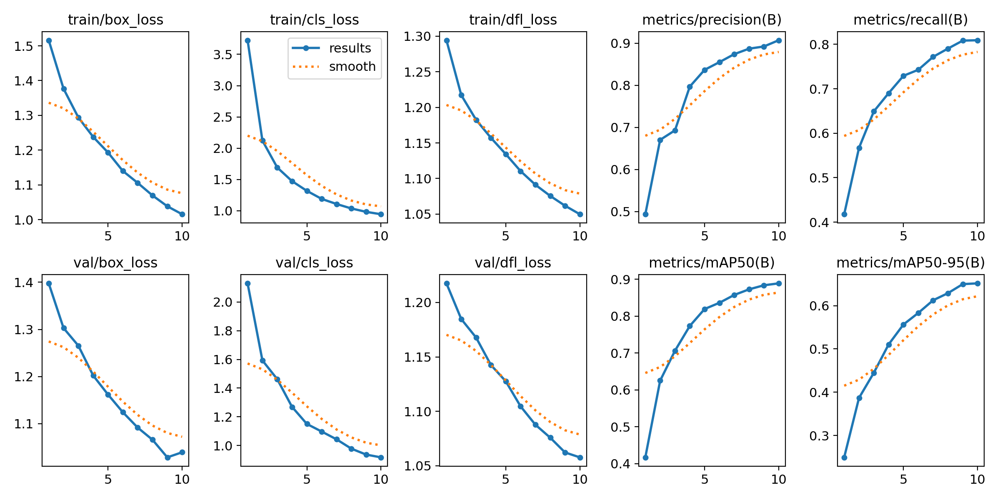

In [14]:
# Mostramos la imagen de los resultados obtenidos con el entrenamiento
Image_(filename=r'..\models\YOLO\runs\detect\train 2 - 10 epochs with synthetic\results.png', width=600, height=400)

De la gráfica, observamos:

- Las métricas de pérdida de entrenamiento y validación (box, cls, dfl) disminuyen de manera continua a lo largo de las 10 épocas. Por lo tanto, tenemos resultados similares a 5 epochs, el modelo sigue aprendiendo de forma estable. El hecho de que val loss sea similar a train loss muestra que el modelo mantiene una buena capacidad de generalización y no presenta sobreajuste evidente.
- Precisión ≈ 0.90 → De cada 100 predicciones positivas realizadas por el modelo, 90 son correctas. Esto implica que el modelo comete muy pocos falsos positivos, identificando los ingredientes con un alto grado de certeza.
- Recall ≈ 0.70 → El modelo detecta más del 80 % de los objetos presentes en las imágenes, reduciendo de forma significativa la cantidad de ingredientes que pasan desapercibidos en comparación con las primeras épocas.
- mAP50 ≈ 0.87 → Con un umbral IoU de 0.5, el modelo logra un rendimiento bastante sólido, detectando de manera correcta la mayoría de los ingredientes y sus ubicaciones aproximadas.
- mAP50-95 ≈ 0.64 → Bajo criterios más estrictos (IoU de 0.5 a 0.95), el modelo obtiene un rendimiento bastante sólido, ha mejorado considerablemente en cuanto al modelo de 5 epochs sin datos sintéticos.

También analizamos la matriz de confusión:


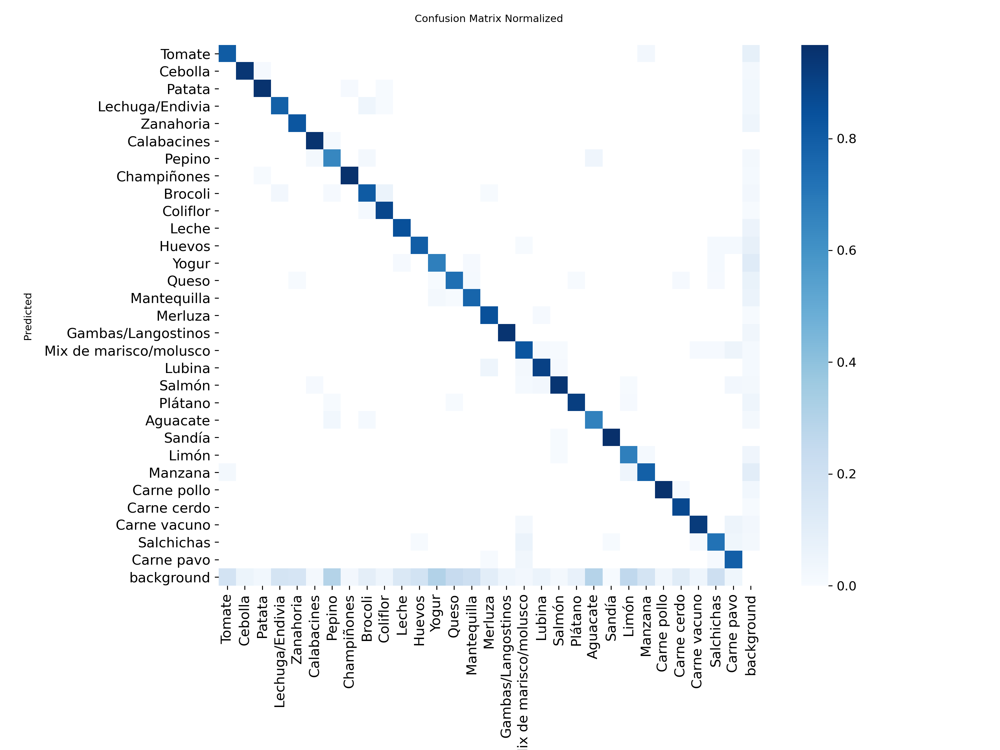

In [16]:
# Matriz de confusión
Image_(filename=r'..\models\YOLO\runs\detect\train 2 - 10 epochs with synthetic\confusion_matrix_normalized.png', width=600, height=400)

La mayoría de las clases tienen una fuerte diagonal marcada en azul oscuro cosa que significa que la gran mayoría de los ingredientes se clasifican correctamente.
Hay algunas confusiones leves, podemos ver cuadrados fuera de la diagonal, lo que representa que el modelo ha predecido mal. Pero dado que no se observa ningún cuadrado oscuro fuera de la diagonal, podemos decir que el modelo es bastante preciso con todas las clases.

Destacamos algunos ejemplos de confusiones:
- El modelo parece confundir a veces el tomate con la manzana, probablemente debido al parecido en color y forma
- El modelo también parece confundir a veces el brocoli con la lechuga

### 1.6) Tercer entrenamiento - modelo 100 epochs con datos sintéticos

En esta sección, entrenaremos un modelo final con 100 épocas con datos sintéticos habiendo validado los siguiented dos puntos:
- El modelo presenta potencial, ya que incluso con pocas épocas (5 o 10) ha alcanzado rendimientos considerables.
- El uso del dataset sintético construido en “1) Construcción de dataset de detección de objetos” es necesario, dado que en los datasets públicos descargados existen clases con representación insuficiente o inexistente. Con el segundo modelo se comprobó que la inclusión de este dataset no distorsiona el entrenamiento y, por el contrario, contribuye a un mejor rendimiento (aunque parte de la mejora también puede atribuirse al mayor número de épocas). En cualquier caso, el modelo no mostró empeoramiento.
- Para el entrenamiento final, además de aumentar el número de épocas a 100, se estableció un tamaño de imagen de 768 píxeles (frente a los 640 anteriores), con el fin de mejorar la precisión en la detección de objetos.

In [4]:
model_100epochs = YOLO('yolo11n.pt')
model_100epochs.train(data=r'..\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\data.yaml', epochs=100, patience=10, imgsz=768) ##768 for better precision

c:\Users\oscar.xu\AppData\Local\anaconda3\envs\TFM_env_2\lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


Ultralytics 8.3.176  Python-3.10.18 torch-2.5.1 CUDA:0 (NVIDIA RTX 2000 Ada Generation Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=..\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=768, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=T

train: Scanning C:\Users\oscar.xu\Desktop\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\train\labels.cache... 11956 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11956/11956 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access  (ping: 0.20.0 ms, read: 179.6127.1 MB/s, size: 169.5 KB)


val: Scanning C:\Users\oscar.xu\Desktop\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\val\labels.cache... 2562 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2562/2562 [00:00<?, ?it/s]


Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 768 train, 768 val
Using 8 dataloader workers
Logging results to runs\detect\train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.96G      1.503      3.689      1.396         35        768: 100%|██████████| 748/748 [03:01<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:26<00:00,  3.10it/s]


                   all       2562      15683      0.441      0.418      0.393      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.96G      1.429      2.237      1.412         27        768: 100%|██████████| 748/748 [03:13<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.38it/s]


                   all       2562      15683      0.652      0.545      0.595      0.358

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.23G      1.418      1.973      1.404         36        768: 100%|██████████| 748/748 [02:47<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:24<00:00,  3.32it/s]


                   all       2562      15683      0.651      0.538      0.585      0.354

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.71G      1.402       1.84      1.408         29        768: 100%|██████████| 748/748 [02:42<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.46it/s]


                   all       2562      15683       0.71      0.613       0.68      0.417

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.71G      1.356      1.666      1.385         26        768: 100%|██████████| 748/748 [02:43<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.41it/s]


                   all       2562      15683      0.762      0.626      0.714      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.71G      1.313      1.499      1.361         23        768: 100%|██████████| 748/748 [02:43<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.40it/s]


                   all       2562      15683      0.809      0.695      0.781      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.71G      1.277      1.384      1.331         27        768: 100%|██████████| 748/748 [02:43<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.46it/s]


                   all       2562      15683      0.808      0.694      0.791      0.522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.01G      1.251      1.307      1.316         11        768: 100%|██████████| 748/748 [02:43<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.49it/s]


                   all       2562      15683      0.843       0.73      0.817      0.549

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.56G      1.223      1.236      1.302         55        768: 100%|██████████| 748/748 [02:42<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.48it/s]


                   all       2562      15683      0.858      0.748      0.838      0.588

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.81G      1.202      1.185      1.289         33        768: 100%|██████████| 748/748 [02:43<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.46it/s]


                   all       2562      15683      0.888      0.762      0.854       0.61

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      3.81G      1.186      1.149      1.278         36        768: 100%|██████████| 748/748 [02:43<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.50it/s]


                   all       2562      15683      0.898      0.778      0.865      0.621

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.81G      1.168      1.103      1.267         58        768: 100%|██████████| 748/748 [02:43<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.52it/s]


                   all       2562      15683      0.898      0.777      0.865      0.627

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.81G       1.15      1.064      1.255         20        768: 100%|██████████| 748/748 [02:43<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.47it/s]


                   all       2562      15683      0.901      0.786      0.871      0.632

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.81G      1.136      1.049      1.245         20        768: 100%|██████████| 748/748 [02:43<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.51it/s]


                   all       2562      15683       0.91      0.789      0.879      0.642

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.06G      1.122      1.018       1.24         30        768: 100%|██████████| 748/748 [02:43<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.52it/s]


                   all       2562      15683      0.902      0.799      0.883      0.652

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.39G      1.113      1.004      1.234         28        768: 100%|██████████| 748/748 [02:43<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.49it/s]


                   all       2562      15683      0.924      0.805       0.89      0.664

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.63G      1.108     0.9886      1.228         20        768: 100%|██████████| 748/748 [02:43<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.54it/s]


                   all       2562      15683       0.91      0.808      0.891      0.664

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       3.9G      1.092     0.9703       1.22         19        768: 100%|██████████| 748/748 [02:43<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.54it/s]


                   all       2562      15683      0.921      0.819        0.9      0.682

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100       3.9G       1.08     0.9402      1.214         37        768: 100%|██████████| 748/748 [02:50<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.47it/s]


                   all       2562      15683      0.933      0.815        0.9       0.68

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       3.9G      1.074     0.9264      1.209         49        768: 100%|██████████| 748/748 [02:43<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.52it/s]


                   all       2562      15683      0.924      0.821      0.903      0.683

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.23G      1.068     0.9207      1.204         33        768: 100%|██████████| 748/748 [02:43<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.58it/s]


                   all       2562      15683      0.936      0.825      0.908      0.694

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.73G      1.061      0.907      1.199         30        768: 100%|██████████| 748/748 [02:55<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.65it/s]


                   all       2562      15683      0.928      0.837       0.91      0.701

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.73G      1.049     0.8908      1.194         38        768: 100%|██████████| 748/748 [02:50<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.59it/s]


                   all       2562      15683       0.93      0.842      0.915      0.704

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.73G      1.044      0.872       1.19         29        768: 100%|██████████| 748/748 [02:47<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:21<00:00,  3.82it/s]


                   all       2562      15683      0.936      0.841      0.916      0.709

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.73G      1.036     0.8681      1.185         39        768: 100%|██████████| 748/748 [02:49<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.51it/s]


                   all       2562      15683       0.94      0.849       0.92       0.72

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.73G      1.028     0.8613      1.178         53        768: 100%|██████████| 748/748 [02:47<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:21<00:00,  3.85it/s]


                   all       2562      15683       0.93      0.852      0.919      0.719

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.74G      1.021     0.8433      1.175         25        768: 100%|██████████| 748/748 [02:47<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.55it/s]


                   all       2562      15683      0.941       0.85      0.922      0.725

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      3.74G      1.015     0.8402      1.169         30        768: 100%|██████████| 748/748 [02:48<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.68it/s]


                   all       2562      15683      0.936      0.858      0.924       0.73

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.74G      1.008     0.8226      1.169         34        768: 100%|██████████| 748/748 [02:45<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.55it/s]


                   all       2562      15683      0.934       0.86      0.926      0.731

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.74G          1     0.8152      1.165         28        768: 100%|██████████| 748/748 [02:48<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.62it/s]


                   all       2562      15683       0.94      0.864      0.929      0.737

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.74G      0.997     0.8039      1.159         46        768: 100%|██████████| 748/748 [02:48<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.61it/s]


                   all       2562      15683      0.941      0.859      0.929      0.739

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.74G     0.9915     0.7991      1.158         33        768: 100%|██████████| 748/748 [02:47<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:23<00:00,  3.49it/s]


                   all       2562      15683      0.941      0.862      0.931      0.744

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.74G     0.9839      0.794      1.151         57        768: 100%|██████████| 748/748 [02:47<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.63it/s]


                   all       2562      15683       0.94      0.866      0.933      0.748

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.74G     0.9805     0.7828      1.149         27        768: 100%|██████████| 748/748 [02:47<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.63it/s]


                   all       2562      15683      0.949      0.864      0.934       0.75

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      3.74G      0.976     0.7803      1.147         31        768: 100%|██████████| 748/748 [02:47<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:22<00:00,  3.57it/s]


                   all       2562      15683      0.945       0.87      0.935      0.753

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.74G     0.9728     0.7794      1.145         37        768: 100%|██████████| 748/748 [02:40<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:17<00:00,  4.68it/s]


                   all       2562      15683       0.95      0.872      0.938      0.756

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.74G     0.9641     0.7628      1.141         47        768: 100%|██████████| 748/748 [04:40<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:41<00:00,  1.93it/s]


                   all       2562      15683      0.944      0.876      0.939      0.759

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.74G     0.9606     0.7541       1.14         51        768: 100%|██████████| 748/748 [05:33<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.25it/s]


                   all       2562      15683       0.95      0.873      0.939      0.761

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      3.74G     0.9617     0.7559      1.136         22        768: 100%|██████████| 748/748 [05:22<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:39<00:00,  2.07it/s]


                   all       2562      15683      0.945      0.882       0.94      0.763

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.74G     0.9554     0.7501      1.137         25        768: 100%|██████████| 748/748 [05:21<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:39<00:00,  2.03it/s]


                   all       2562      15683      0.947      0.876      0.941      0.767

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.74G      0.953     0.7516      1.132         33        768: 100%|██████████| 748/748 [05:22<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:38<00:00,  2.12it/s]


                   all       2562      15683      0.952      0.879      0.942       0.77

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.74G     0.9424     0.7319      1.127         35        768: 100%|██████████| 748/748 [05:27<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:42<00:00,  1.92it/s]


                   all       2562      15683      0.941      0.886      0.943      0.771

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      3.74G     0.9438     0.7341      1.125         19        768: 100%|██████████| 748/748 [05:14<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:39<00:00,  2.05it/s]


                   all       2562      15683       0.95      0.883      0.943      0.773

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.74G     0.9341     0.7271      1.119         52        768: 100%|██████████| 748/748 [05:16<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.27it/s]


                   all       2562      15683      0.948      0.884      0.944      0.775

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.74G     0.9334     0.7192      1.122         20        768: 100%|██████████| 748/748 [05:13<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.27it/s]


                   all       2562      15683      0.949      0.887      0.945      0.776

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.74G      0.926       0.71       1.12         77        768: 100%|██████████| 748/748 [05:14<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.31it/s]


                   all       2562      15683      0.954      0.885      0.945      0.778

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.74G     0.9174     0.7052      1.113         52        768: 100%|██████████| 748/748 [05:37<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:36<00:00,  2.22it/s]


                   all       2562      15683      0.955      0.884      0.946       0.78

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.74G     0.9176     0.7024      1.111         54        768: 100%|██████████| 748/748 [05:11<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.31it/s]


                   all       2562      15683      0.952       0.89      0.946      0.781

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.74G     0.9152      0.699      1.108         45        768: 100%|██████████| 748/748 [05:10<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.30it/s]


                   all       2562      15683      0.951      0.891      0.947      0.785

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.74G     0.9107     0.6919      1.106         52        768: 100%|██████████| 748/748 [05:08<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.34it/s]


                   all       2562      15683       0.95      0.893      0.948      0.787

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.74G     0.9071      0.689      1.105         56        768: 100%|██████████| 748/748 [05:10<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:33<00:00,  2.39it/s]


                   all       2562      15683      0.955      0.891      0.948      0.788

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      3.74G     0.9012     0.6854      1.102         35        768: 100%|██████████| 748/748 [05:08<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:36<00:00,  2.23it/s]


                   all       2562      15683      0.952      0.893      0.948       0.79

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      3.74G     0.8973     0.6799      1.099         45        768: 100%|██████████| 748/748 [05:15<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.30it/s]


                   all       2562      15683      0.952      0.895      0.948      0.792

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      3.74G     0.8942     0.6722      1.098         46        768: 100%|██████████| 748/748 [05:12<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:36<00:00,  2.24it/s]


                   all       2562      15683      0.956      0.894       0.95      0.793

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.74G     0.8888     0.6656      1.094         42        768: 100%|██████████| 748/748 [05:12<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.28it/s]


                   all       2562      15683      0.954      0.899       0.95      0.795

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.74G     0.8865     0.6636      1.093         48        768: 100%|██████████| 748/748 [05:06<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:33<00:00,  2.38it/s]


                   all       2562      15683      0.951      0.899       0.95      0.795

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.74G     0.8883     0.6619       1.09         27        768: 100%|██████████| 748/748 [05:19<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.29it/s]


                   all       2562      15683      0.952      0.898      0.951      0.796

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.74G     0.8779     0.6561      1.088         16        768: 100%|██████████| 748/748 [05:23<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:36<00:00,  2.24it/s]


                   all       2562      15683      0.959      0.894      0.951      0.797

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.74G     0.8758     0.6512      1.085         27        768: 100%|██████████| 748/748 [05:17<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.34it/s]


                   all       2562      15683      0.954      0.897      0.951      0.799

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.74G     0.8694     0.6442       1.08         16        768: 100%|██████████| 748/748 [05:12<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.36it/s]


                   all       2562      15683      0.955      0.897      0.951        0.8

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      3.74G     0.8707     0.6466      1.083         24        768: 100%|██████████| 748/748 [05:07<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.34it/s]


                   all       2562      15683      0.958      0.896      0.952      0.802

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.74G     0.8667      0.644      1.079         18        768: 100%|██████████| 748/748 [05:11<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.36it/s]


                   all       2562      15683      0.956        0.9      0.952      0.803

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.74G     0.8634     0.6415      1.077         42        768: 100%|██████████| 748/748 [05:17<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.34it/s]


                   all       2562      15683      0.957        0.9      0.953      0.804

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.74G     0.8548     0.6284      1.074         51        768: 100%|██████████| 748/748 [05:16<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.34it/s]


                   all       2562      15683      0.959        0.9      0.953      0.805

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      3.74G     0.8568     0.6313      1.078         26        768: 100%|██████████| 748/748 [05:16<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.35it/s]


                   all       2562      15683      0.958      0.902      0.954      0.806

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.74G     0.8517      0.622      1.074         34        768: 100%|██████████| 748/748 [05:07<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]


                   all       2562      15683      0.956      0.902      0.954      0.807

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.74G     0.8451     0.6203      1.069         18        768: 100%|██████████| 748/748 [05:08<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.33it/s]


                   all       2562      15683      0.958        0.9      0.954      0.807

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      3.74G     0.8464     0.6226      1.071         38        768: 100%|██████████| 748/748 [05:38<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.32it/s]


                   all       2562      15683      0.959      0.901      0.954      0.808

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.74G     0.8343     0.6079      1.062         36        768: 100%|██████████| 748/748 [05:24<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.34it/s]


                   all       2562      15683      0.959      0.903      0.954       0.81

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      3.74G      0.837     0.6064      1.065         47        768: 100%|██████████| 748/748 [05:15<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.36it/s]


                   all       2562      15683       0.96      0.902      0.955       0.81

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      3.74G      0.835     0.6044      1.062         38        768: 100%|██████████| 748/748 [05:10<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.35it/s]


                   all       2562      15683      0.958      0.905      0.955      0.812

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.74G     0.8359      0.607      1.063         34        768: 100%|██████████| 748/748 [05:07<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.38it/s]


                   all       2562      15683      0.958      0.905      0.955      0.813

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      3.74G     0.8237     0.5975      1.056         17        768: 100%|██████████| 748/748 [05:12<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.35it/s]


                   all       2562      15683       0.96      0.905      0.955      0.813

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.74G     0.8241     0.5938      1.055         49        768: 100%|██████████| 748/748 [05:11<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.32it/s]


                   all       2562      15683      0.957      0.908      0.955      0.814

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.74G       0.82     0.5885      1.054         25        768: 100%|██████████| 748/748 [05:06<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.34it/s]


                   all       2562      15683      0.958      0.907      0.955      0.814

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      3.74G     0.8145     0.5837      1.053         64        768: 100%|██████████| 748/748 [05:08<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.28it/s]


                   all       2562      15683      0.959      0.907      0.956      0.814

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      3.74G     0.8124      0.587      1.051         35        768: 100%|██████████| 748/748 [05:07<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.26it/s]


                   all       2562      15683      0.961      0.906      0.956      0.815

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.74G     0.8101     0.5803       1.05         29        768: 100%|██████████| 748/748 [05:32<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.28it/s]


                   all       2562      15683      0.962      0.905      0.956      0.815

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      3.74G     0.8079     0.5801      1.046         55        768: 100%|██████████| 748/748 [05:17<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.28it/s]


                   all       2562      15683      0.963      0.905      0.956      0.816

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      3.74G     0.8031     0.5685      1.044         35        768: 100%|██████████| 748/748 [05:08<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.27it/s]


                   all       2562      15683      0.962      0.906      0.956      0.816

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      3.74G     0.7974     0.5642       1.04         67        768: 100%|██████████| 748/748 [05:16<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.30it/s]


                   all       2562      15683      0.961      0.908      0.956      0.817

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      3.74G        0.8     0.5684      1.042         61        768: 100%|██████████| 748/748 [05:13<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.33it/s]


                   all       2562      15683      0.959       0.91      0.956      0.817

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.74G     0.7941      0.565      1.041         21        768: 100%|██████████| 748/748 [05:16<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:33<00:00,  2.41it/s]


                   all       2562      15683       0.96      0.909      0.956      0.818

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.74G     0.7887     0.5547      1.036         46        768: 100%|██████████| 748/748 [05:11<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.31it/s]


                   all       2562      15683      0.961      0.909      0.957      0.818

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      3.74G     0.7858     0.5541      1.034         29        768: 100%|██████████| 748/748 [05:08<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.28it/s]


                   all       2562      15683      0.961       0.91      0.957      0.819

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      3.74G     0.7822     0.5491      1.033         35        768: 100%|██████████| 748/748 [05:16<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.27it/s]


                   all       2562      15683      0.961      0.911      0.957      0.819

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      3.74G     0.7793     0.5506      1.031         37        768: 100%|██████████| 748/748 [05:11<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.29it/s]


                   all       2562      15683       0.96      0.911      0.957       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      3.74G     0.7723     0.5431      1.028         39        768: 100%|██████████| 748/748 [05:24<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:36<00:00,  2.24it/s]


                   all       2562      15683       0.96      0.912      0.957       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.74G     0.7729     0.5427      1.029         31        768: 100%|██████████| 748/748 [05:21<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.33it/s]


                   all       2562      15683       0.96      0.912      0.957       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      3.74G     0.7684      0.538      1.027         48        768: 100%|██████████| 748/748 [05:12<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:35<00:00,  2.29it/s]


                   all       2562      15683       0.96      0.912      0.958      0.821
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      3.74G     0.7103     0.4598      1.009         22        768: 100%|██████████| 748/748 [04:08<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:25<00:00,  3.14it/s]


                   all       2562      15683       0.96      0.912      0.958      0.821

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      3.74G     0.6961     0.4449      1.004         28        768: 100%|██████████| 748/748 [03:37<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:24<00:00,  3.31it/s]


                   all       2562      15683      0.961      0.912      0.958      0.821

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      3.74G     0.6873     0.4371     0.9978         21        768: 100%|██████████| 748/748 [04:39<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:27<00:00,  2.90it/s]


                   all       2562      15683      0.961      0.911      0.958      0.822

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      3.74G     0.6823     0.4346     0.9929         20        768: 100%|██████████| 748/748 [04:36<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:27<00:00,  2.92it/s]


                   all       2562      15683      0.963      0.911      0.958      0.822

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      3.74G     0.6764     0.4313     0.9897         24        768: 100%|██████████| 748/748 [05:11<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:39<00:00,  2.07it/s]


                   all       2562      15683      0.962      0.911      0.958      0.823

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      3.74G     0.6705     0.4232      0.987         26        768: 100%|██████████| 748/748 [04:21<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:34<00:00,  2.32it/s]


                   all       2562      15683      0.961      0.913      0.958      0.823

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      3.74G     0.6634      0.421     0.9839         14        768: 100%|██████████| 748/748 [04:05<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:28<00:00,  2.84it/s]


                   all       2562      15683      0.963      0.912      0.958      0.823

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      3.74G     0.6579     0.4136     0.9815         15        768: 100%|██████████| 748/748 [04:44<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:27<00:00,  2.90it/s]


                   all       2562      15683      0.964      0.911      0.958      0.823

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      3.74G     0.6515     0.4091     0.9779         27        768: 100%|██████████| 748/748 [04:27<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:37<00:00,  2.14it/s]


                   all       2562      15683      0.964      0.911      0.958      0.824

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      3.74G      0.653     0.4133     0.9795         29        768: 100%|██████████| 748/748 [05:48<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:39<00:00,  2.03it/s]


                   all       2562      15683      0.965      0.911      0.958      0.824

100 epochs completed in 8.046 hours.
Optimizer stripped from runs\detect\train\weights\last.pt, 5.5MB
Optimizer stripped from runs\detect\train\weights\best.pt, 5.5MB

Validating runs\detect\train\weights\best.pt...
Ultralytics 8.3.176  Python-3.10.18 torch-2.5.1 CUDA:0 (NVIDIA RTX 2000 Ada Generation Laptop GPU, 8188MiB)
YOLO11n summary (fused): 100 layers, 2,588,002 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 81/81 [00:45<00:00,  1.78it/s]


                   all       2562      15683      0.965      0.911      0.958      0.824
                Tomate        930       1222      0.958      0.849      0.941      0.765
               Cebolla        498        508      0.994      0.964      0.994      0.889
                Patata        621        629      0.992      0.972      0.993      0.864
       Lechuga/Endivia        314        347      0.948      0.885      0.954       0.79
             Zanahoria        720        853      0.959      0.859      0.942      0.759
           Calabacines        101        110          1      0.996      0.995      0.947
                Pepino        255        330       0.92       0.73       0.85      0.686
           Championes        453        455      0.991      0.969      0.994      0.858
               Brocoli        149        208      0.952      0.957       0.98      0.852
              Coliflor        104        135      0.993      0.984      0.994      0.904
                 Leche

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000026160C6BBE0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,    

In [7]:
# Validación con test
model_final = YOLO(r"..\models\YOLO\runs\detect\train 3 - 100 epochs with synthetic\weights\best.pt")
metrics = model_final.val(data=r"..\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\data.yaml", split="test")


Ultralytics 8.3.179  Python-3.10.18 torch-2.7.1+cu118 CUDA:0 (NVIDIA RTX 2000 Ada Generation Laptop GPU, 8188MiB)
YOLO11n summary (fused): 100 layers, 2,588,002 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 737.3432.8 MB/s, size: 97.9 KB)


val: Scanning C:\Users\oscar.xu\Desktop\TFM_RecoBite\dataset\YOLO - Clean dataset\Clean dataset 2\split dataset\test\labels.cache... 2563 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2563/2563 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 161/161 [00:20<00:00,  7.82it/s]


                   all       2563      15377      0.959      0.902      0.954      0.815
                Tomate        954       1216      0.957      0.859      0.943       0.78
               Cebolla        487        519      0.986      0.948      0.994      0.861
                Patata        639        645      0.987      0.972      0.994      0.864
       Lechuga/Endivia        284        316      0.933      0.858      0.935      0.768
             Zanahoria        718        850      0.955      0.865      0.944      0.766
           Calabacines        105        120      0.986          1      0.995       0.94
                Pepino        221        292      0.944      0.688      0.796      0.647
           Championes        519        521      0.994      0.976      0.994      0.849
               Brocoli        166        270       0.92      0.915      0.944      0.795
              Coliflor         94        142      0.917      0.915      0.969       0.82
                 Leche

In [8]:
metrics

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000016F0252F0A0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,    

### 1.7) Tercer modelo - evaluación del modelo

Procedemos a evaluar el rendimiento del modelo final de 100 epochs

In [18]:
model_100epochs_results = pd.read_csv(r'..\models\YOLO\runs\detect\train 3 - 100 epochs with synthetic\results.csv')
model_100epochs_results

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,208.367,1.50346,3.68901,1.39636,0.44084,0.41844,0.39342,0.22944,1.39809,2.16261,1.48212,0.003329,0.003329,0.003329
1,2,427.260,1.42860,2.23747,1.41237,0.65243,0.54545,0.59519,0.35825,1.35088,1.76325,1.43833,0.006596,0.006596,0.006596
2,3,620.416,1.41770,1.97345,1.40398,0.65078,0.53806,0.58451,0.35436,1.39554,1.91125,1.48017,0.009798,0.009798,0.009798
3,4,807.565,1.40221,1.84017,1.40800,0.71049,0.61256,0.67957,0.41734,1.34661,1.62963,1.49138,0.009703,0.009703,0.009703
4,5,995.997,1.35634,1.66610,1.38529,0.76167,0.62632,0.71438,0.45222,1.30512,1.49996,1.42231,0.009604,0.009604,0.009604
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,27681.600,0.67046,0.42317,0.98704,0.96065,0.91259,0.95822,0.82318,0.72355,0.49392,1.01697,0.000595,0.000595,0.000595
96,97,27957.000,0.66340,0.42099,0.98391,0.96254,0.91156,0.95828,0.82324,0.72285,0.49315,1.01647,0.000496,0.000496,0.000496
97,98,28269.800,0.65792,0.41357,0.98150,0.96353,0.91131,0.95825,0.82335,0.72194,0.49255,1.01588,0.000397,0.000397,0.000397
98,99,28575.700,0.65151,0.40909,0.97788,0.96374,0.91139,0.95814,0.82369,0.72115,0.49171,1.01539,0.000298,0.000298,0.000298


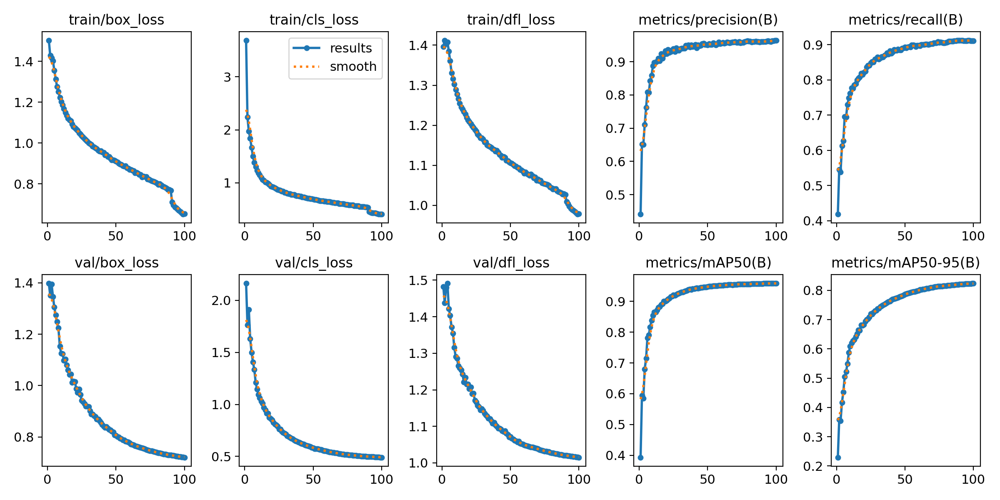

In [20]:
# Mostramos la imagen de los resultados obtenidos con el entrenamiento
Image_(filename=r'..\models\YOLO\runs\detect\train 3 - 100 epochs with synthetic\results.png', width=800, height=600)

- El modelo entrenado con 100 épocas muestra un aprendizaje estable y continuo sin síntomas de sobreajuste. Se decide parar el 100 epochs porque en las gráficas ya vemos como las métricas empiezan a estancarse y no hay mucha mejora incluso si aumentásemos la cantidad de épocas. Dado que los recursos computacionales son limitados, se decide dejar el modelo en 100 epochs.
- Se alcanzan valores muy altos de precisión (~0.96) y recall (~0.90), lo que significa que el modelo rara vez se equivoca al predecir y casi nunca deja objetos sin detectar.
- El mAP50 (~0.95) confirma que detecta de manera excelente los ingredientes presentes.
- El mAP50-95 (~0.83) indica que además logra delimitar con gran exactitud los bordes de los ingredientes, algo difícil en visión por computador.
- En conjunto, los resultados son muy sólidos y competitivos a nivel de benchmarks modernos, mostrando que el modelo es apto para aplicaciones reales en detección de ingredientes en neveras

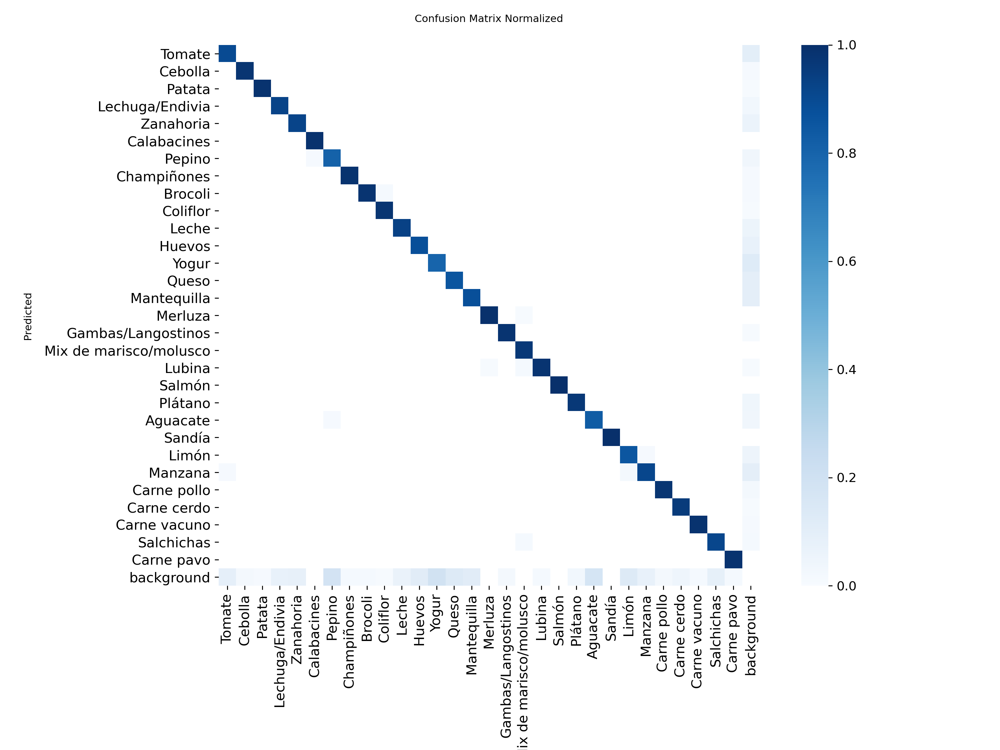

In [21]:
# Matriz de confusión
Image_(filename=r'..\models\YOLO\runs\detect\train 3 - 100 epochs with synthetic\confusion_matrix_normalized.png', width=600, height=400)

En la matriz de confusión final, en comparción con la matriz del segundo modelo, se ve clarísimo que la cantidad de cuadrados fuera de la diagonal (predicciones erróneas) ha disminuido considerablemente.

A continuación, procedemos a utilizar el modelo con fotos de neveras reales.

In [33]:
# Probamos con fotos reales - Foto nevera 1 con modelo final

image_path = r"..\dataset\YOLO - Clean dataset\Real fridge pictures\my_fridge_1.jpg"

results = model_final.predict(
    source=image_path,
    conf=0.05,           # Ponemos una confianza baja para identificar lo máximo en este ejemplo
    save=True,         
    project=r"..\models\YOLO\runs\predict\real-fridge", 
    name="real_fridge_1",      
    exist_ok=False,      
    show_conf=False
)


image 1/1 c:\Users\oscar.xu\Desktop\TFM_RecoBite\notebooks\..\dataset\YOLO - Clean dataset\Real fridge pictures\my_fridge_1.jpg: 768x576 3 Tomates, 1 Lechuga/Endivia, 3 Zanahorias, 1 Pepino, 1 Huevos, 4 Yogurs, 1 Queso, 1 Mantequilla, 2 Pltanos, 3 Aguacates, 1 Limn, 1 Manzana, 2 Carne pollos, 10.5ms
Speed: 4.1ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 768, 576)
Results saved to ..\models\YOLO\runs\predict\real-fridge\real_fridge_1


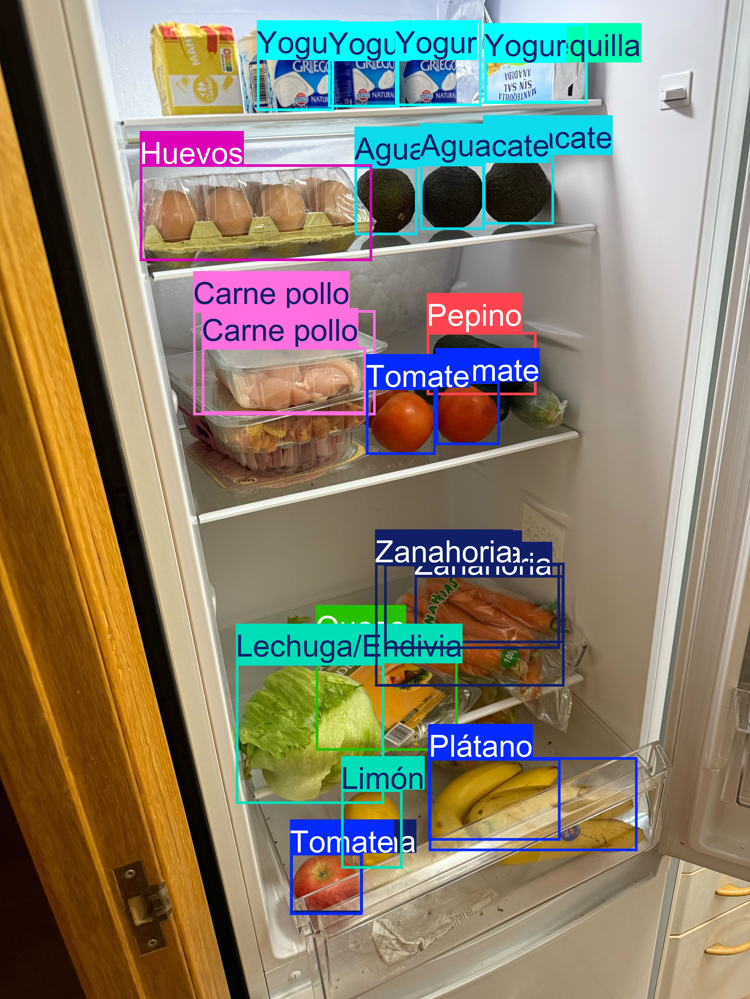

In [35]:
Image_(filename=r'..\models\YOLO\runs\predict\real-fridge\real_fridge_1\my_fridge_1.jpg', width=400, height=200)

Vemos que el modelo ha conseguido identificar casi todos los objetos sin errores a excepción de:
- No identifica la mantequilla de la esquina superior a la izquierda
- Identifica la manzana como un tomate

In [31]:
# Probamos con fotos reales - Foto nevera 2 con modelo final
image_path = r"..\dataset\YOLO - Clean dataset\Real fridge pictures\my_fridge_2.jpg"

results = model_final.predict(
    source=image_path,
    conf=0.05,        
    save=True,         
    project=r"..\models\YOLO\runs\predict\real-fridge",  
    name="real_fridge_2",      
    exist_ok=True,
    show_conf=False       
)



image 1/1 c:\Users\oscar.xu\Desktop\TFM_RecoBite\notebooks\..\dataset\YOLO - Clean dataset\Real fridge pictures\my_fridge_2.jpg: 768x576 3 Tomates, 2 Zanahorias, 4 Pepinos, 1 Huevos, 3 Yogurs, 1 Queso, 1 Mantequilla, 3 Pltanos, 3 Aguacates, 1 Limn, 1 Manzana, 1 Carne pollo, 86.7ms
Speed: 29.5ms preprocess, 86.7ms inference, 2.1ms postprocess per image at shape (1, 3, 768, 576)
Results saved to ..\models\YOLO\runs\predict\real-fridge\real_fridge_2


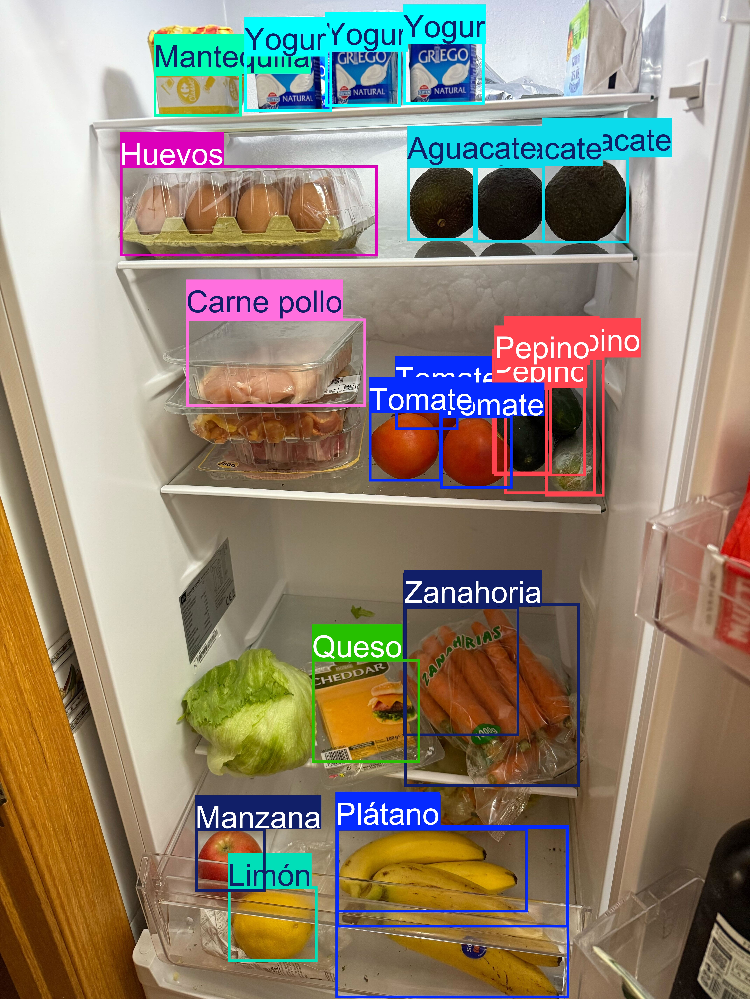

In [37]:
Image_(filename=r'..\models\YOLO\runs\predict\real-fridge\real_fridge_2\my_fridge_2.jpg', width=400, height=200)

Al cambiar de ángulo, vemos que el modelo ha rectificado su predicción sobre la manzana, y ya no predice que es tomate. Sin embargo, ha dejado de detectar la lechuga. Pero generalmente hablando, el modelo ha podido detectar todo y sin errores.

## 2) Evaluación y comparación de modelos

In [60]:
# Unimos los resultados de los 3 modelos y sus entrenamientos

train_results_1 = pd.read_csv(r'..\models\YOLO\runs\detect\train 1 - 5 epochs without synthethic\results.csv')
train_results_1['Train_type'] = 'Modelo 1 - 5 epochs, sin datos sintéticos'

train_results_2 = pd.read_csv(r'..\models\YOLO\runs\detect\train 2 - 10 epochs with synthetic\results.csv')
train_results_2['Train_type'] = 'Modelo 2 - 10 epochs, con datos sintéticos'

train_results_3 = pd.read_csv(r'..\models\YOLO\runs\detect\train 3 - 100 epochs with synthetic\results.csv')
train_results_3['Train_type'] = 'Modelo 3 - 100 epochs, con datos sintéticos'

train_results_combined = pd.concat([train_results_1, train_results_2, train_results_3])

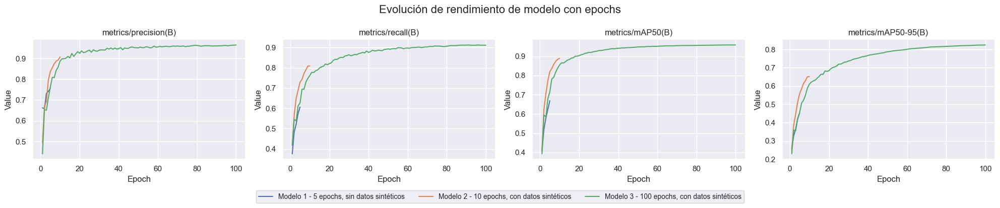

In [74]:
# Gráficas sencillas para mostrar la evolución de las métricas según avanzan epochs
fig, axes = plt.subplots(1, 4, figsize=(20, 4))
axes = axes.flatten()
metric_list = train_results_combined.columns[5:9]

hue_order = sorted(train_results_combined['Train_type'].unique())
palette = sns.color_palette(n_colors=len(hue_order))
handles = labels = None
for i, metric in enumerate(metric_list):
    ax = axes[i]
    show_legend = (i == 0)  
    sns.lineplot(
        data=train_results_combined,
        x='epoch',
        y=metric,
        hue='Train_type',
        hue_order=hue_order,
        palette=palette,
        ax=ax,
        legend=show_legend
    )
    ax.set_title(metric)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Value")
    ax.grid(True)

    if show_legend:
  
        handles, labels = ax.get_legend_handles_labels()
        ax.legend_.remove()

# Añadiendo una leyendo global
fig.legend(handles, labels, loc="lower center", ncol=len(labels), fontsize=10,
           bbox_to_anchor=(0.5, -0.02))
fig.suptitle('Evolución de rendimiento de modelo con epochs', fontsize=16)
plt.tight_layout(rect=[0, 0.05, 1, 1]) 
plt.show()


In [89]:
last_model_epochs = train_results_combined.groupby('Train_type').tail(1)
melted_last_model_epochs = pd.melt(last_model_epochs, id_vars="Train_type", value_vars=['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)'], var_name='metric', value_name='value')

# Añado datos de referencia
ref_data = [
    ("metrics/precision(B)", "Modelo aceptable", 0.6),
    ("metrics/precision(B)", "Modelo bueno", 0.8),
    ("metrics/precision(B)", "Modelo SOTA", 0.9),

    ("metrics/recall(B)", "Modelo aceptable", 0.5),
    ("metrics/recall(B)", "Modelo bueno", 0.7),
    ("metrics/recall(B)", "Modelo SOTA", 0.85),

    ("metrics/mAP50(B)", "Modelo aceptable", 0.6),
    ("metrics/mAP50(B)", "Modelo bueno", 0.8),
    ("metrics/mAP50(B)", "Modelo SOTA", 0.85),

    ("metrics/mAP50-95(B)", "Modelo aceptable", 0.4),
    ("metrics/mAP50-95(B)", "Modelo bueno", 0.6),
    ("metrics/mAP50-95(B)", "Modelo SOTA", 0.65),
]

ref_df = pd.DataFrame(ref_data, columns=["metric", "Train_type", "value"])

# Lo junto todo
merged_df = pd.concat([melted_last_model_epochs, ref_df], ignore_index=True)
merged_df

,Train_type,metric,value
0,"Modelo 1 - 5 epochs, sin datos sintéticos",metrics/precision(B),0.75576
1,"Modelo 2 - 10 epochs, con datos sintéticos",metrics/precision(B),0.90696
2,"Modelo 3 - 100 epochs, con datos sintéticos",metrics/precision(B),0.96477
3,"Modelo 1 - 5 epochs, sin datos sintéticos",metrics/recall(B),0.60629
4,"Modelo 2 - 10 epochs, con datos sintéticos",metrics/recall(B),0.80921
5,"Modelo 3 - 100 epochs, con datos sintéticos",metrics/recall(B),0.91097
6,"Modelo 1 - 5 epochs, sin datos sintéticos",metrics/mAP50(B),0.66900
7,"Modelo 2 - 10 epochs, con datos sintéticos",metrics/mAP50(B),0.88892
8,"Modelo 3 - 100 epochs, con datos sintéticos",metrics/mAP50(B),0.95830
9,"Modelo 1 - 5 epochs, sin datos sintéticos",metrics/mAP50-95(B),0.45282


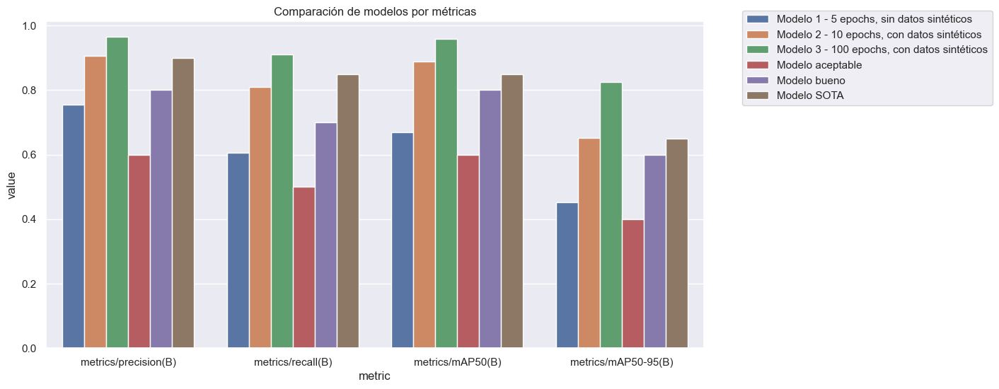

In [90]:
plt.figure(figsize=(12,6))
sns.barplot(data=merged_df, x='metric', y='value', hue='Train_type')
plt.legend(bbox_to_anchor=(1.05,1.05))
plt.title('Comparación de modelos por métricas')
plt.show()

Podemos ver que el modelo 3 tiene métricas muy buenas que superan incluso lo que se considera generalmente State of Art